# Notebook 06 - SEN12 Cross-Dataset Inference

This notebook runs qualitative cross-dataset inference on SEN12-FLOOD imagery using:

- Baseline RGB U-Net from Notebook 02
- Hybrid SAM-U-Net from Notebook 04

SEN12-FLOOD does not provide pixel-level segmentation masks in this project setup, so this notebook produces qualitative predictions, overlays, and a small metadata summary rather than quantitative segmentation metrics.

## Inputs and Outputs

Inputs:

- SEN12-FLOOD optical bands from `D:\Research\SEN12_flood\SEN12FLOOD`
- Baseline U-Net checkpoint from Notebook 02
- Hybrid SAM-U-Net checkpoint from Notebook 04
- SAM ViT-B checkpoint for on-the-fly SAM embedding extraction

Outputs:

- Side-by-side qualitative comparisons
- Overlay images
- Binary prediction arrays for selected SEN12 scenes
- CSV/JSON summary of processed scenes

In [1]:
from pathlib import Path
import json
import random
import re
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio
import cv2
from PIL import Image
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F

from segment_anything import sam_model_registry

print("Libraries loaded")

Libraries loaded


In [3]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)
if DEVICE == "cuda":
    print("CUDA device:", torch.cuda.get_device_name(0))

Device: cuda
CUDA device: NVIDIA GeForce RTX 3050 6GB Laptop GPU


In [4]:
PROJECT_ROOT = Path(r"D:\Research\hybrid_sam\FusionSAM-Flood-Mapping") 
SEN12_ROOT = Path(r"D:\Research\SEN12_flood\SEN12FLOOD")
SEN12_METADATA = SEN12_ROOT / "S2list.json"
SAM_CHECKPOINT = Path(r"D:\Research\SEN12_flood\sam_vit_b_01ec64.pth") 
BASELINE_CANDIDATES = [ PROJECT_ROOT / "checkpoints" / "best_unet_weighted_augmented.pth", PROJECT_ROOT / "checkpoints" / "hybrid_sam_unet" / "best_unet_weighted_augmented.pth", ]
HYBRID_CANDIDATES = [ PROJECT_ROOT / "checkpoints" / "hybrid_sam_unet" / "best_hybrid_sam_unet.pth", PROJECT_ROOT / "checkpoints" / "best_hybrid_sam_unet.pth", ] 
RESULTS_DIR = PROJECT_ROOT / "results" / "notebook_06_sen12_inference"
COMPARISON_DIR = RESULTS_DIR / "comparisons"
OVERLAY_DIR = RESULTS_DIR / "overlays" 
PREDICTION_DIR = RESULTS_DIR / "prediction_arrays"
for path in [RESULTS_DIR, COMPARISON_DIR, OVERLAY_DIR, PREDICTION_DIR]: path.mkdir(parents=True, exist_ok=True)
MODEL_INPUT_SIZE = 128 
SAM_INPUT_SIZE = 1024 
THRESHOLD = 0.5 
MAX_SCENES = 12 
PREFER_FLOODING = True
REQUIRE_FULL_COVERAGE = True 
print("SEN12 root exists:", SEN12_ROOT.exists())
print("SEN12 metadata exists:", SEN12_METADATA.exists()) 
print("SAM checkpoint exists:", SAM_CHECKPOINT.exists())

SEN12 root exists: True
SEN12 metadata exists: True
SAM checkpoint exists: True


In [7]:
def first_existing(paths):
    for path in paths:
        if path.exists():
            return path
    return None

BASELINE_CHECKPOINT = first_existing(BASELINE_CANDIDATES)
HYBRID_CHECKPOINT = first_existing(HYBRID_CANDIDATES)

print("Baseline checkpoint:", BASELINE_CHECKPOINT)
print("Hybrid checkpoint:", HYBRID_CHECKPOINT)

assert BASELINE_CHECKPOINT is not None, "Baseline U-Net checkpoint not found."
assert HYBRID_CHECKPOINT is not None, "Hybrid SAM-U-Net checkpoint not found."
assert SAM_CHECKPOINT.exists(), "SAM ViT-B checkpoint not found."

Baseline checkpoint: D:\Research\hybrid_sam\FusionSAM-Flood-Mapping\checkpoints\hybrid_sam_unet\best_unet_weighted_augmented.pth
Hybrid checkpoint: D:\Research\hybrid_sam\FusionSAM-Flood-Mapping\checkpoints\hybrid_sam_unet\best_hybrid_sam_unet.pth


## Model Definitions

The Baseline U-Net architecture must match Notebook 02 exactly. The Hybrid SAM-U-Net architecture must match Notebook 04 exactly. This is necessary for checkpoint loading.

In [ ]:
class BaselineDoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.down1 = BaselineDoubleConv(in_channels, 64)
        self.down2 = BaselineDoubleConv(64, 128)
        self.down3 = BaselineDoubleConv(128, 256)
        self.down4 = BaselineDoubleConv(256, 512)
        self.bottleneck = BaselineDoubleConv(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = BaselineDoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = BaselineDoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = BaselineDoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = BaselineDoubleConv(128, 64)
        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(self.pool(d1))
        d3 = self.down3(self.pool(d2))
        d4 = self.down4(self.pool(d3))
        bottleneck = self.bottleneck(self.pool(d4))
        u4 = self.up4(bottleneck)
        u4 = torch.cat([u4, d4], dim=1)
        u4 = self.dec4(u4)
        u3 = self.up3(u4)
        u3 = torch.cat([u3, d3], dim=1)
        u3 = self.dec3(u3)
        u2 = self.up2(u3)
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.dec2(u2)
        u1 = self.up1(u2)
        u1 = torch.cat([u1, d1], dim=1)
        u1 = self.dec1(u1)
        return self.final(u1)

In [ ]:
class HybridDoubleConv(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)


class HybridSAMUNet(nn.Module):
    def __init__(self, in_channels: int = 3, sam_channels: int = 256):
        super().__init__()
        self.e1 = HybridDoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.e2 = HybridDoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.bottleneck = HybridDoubleConv(128 + sam_channels, 256)
        self.up1 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.d1 = HybridDoubleConv(128 + 128, 128)
        self.up2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.d2 = HybridDoubleConv(64 + 64, 64)
        self.out = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x, sam_feature, return_shapes: bool = False):
        e1 = self.e1(x)
        p1 = self.pool1(e1)
        e2 = self.e2(p1)
        p2 = self.pool2(e2)
        sam_resized = F.interpolate(
            sam_feature,
            size=p2.shape[2:],
            mode="bilinear",
            align_corners=False,
        )
        fusion = torch.cat([p2, sam_resized], dim=1)
        b = self.bottleneck(fusion)
        u1 = self.up1(b)
        u1 = torch.cat([u1, e2], dim=1)
        d1 = self.d1(u1)
        u2 = self.up2(d1)
        u2 = torch.cat([u2, e1], dim=1)
        d2 = self.d2(u2)
        logits = self.out(d2)
        if return_shapes:
            return logits, {
                "encoder_p2_shape": tuple(p2.shape),
                "sam_feature_shape": tuple(sam_feature.shape),
                "resized_sam_feature_shape": tuple(sam_resized.shape),
                "fusion_tensor_shape": tuple(fusion.shape),
                "output_shape": tuple(logits.shape),
                "resize_strategy": "bilinear interpolation, align_corners=False",
            }
        return logits

In [ ]:
def load_baseline_model(checkpoint_path: Path):
    model = UNet(in_channels=3, out_channels=1).to(DEVICE)
    state = torch.load(checkpoint_path, map_location=DEVICE)
    model.load_state_dict(state)
    model.eval()
    return model


def load_hybrid_model(checkpoint_path: Path):
    model = HybridSAMUNet(in_channels=3, sam_channels=256).to(DEVICE)
    checkpoint = torch.load(checkpoint_path, map_location=DEVICE)
    state = checkpoint.get("model_state_dict", checkpoint)
    model.load_state_dict(state)
    model.eval()
    return model, checkpoint

baseline_model = load_baseline_model(BASELINE_CHECKPOINT)
hybrid_model, hybrid_checkpoint = load_hybrid_model(HYBRID_CHECKPOINT)

print("Baseline U-Net loaded")
print("Hybrid SAM-U-Net loaded")
if isinstance(hybrid_checkpoint, dict) and "shape_report" in hybrid_checkpoint:
    print("Notebook 04 fusion shape report:")
    print(json.dumps(hybrid_checkpoint["shape_report"], indent=2))

Baseline U-Net loaded
Hybrid SAM-U-Net loaded
Notebook 04 fusion shape report:
{
  "encoder_p2_shape": [
    4,
    128,
    32,
    32
  ],
  "sam_feature_shape": [
    4,
    256,
    64,
    64
  ],
  "resized_sam_feature_shape": [
    4,
    256,
    32,
    32
  ],
  "fusion_tensor_shape": [
    4,
    384,
    32,
    32
  ],
  "output_shape": [
    4,
    1,
    128,
    128
  ],
  "resize_strategy": "torch.nn.functional.interpolate(mode='bilinear', align_corners=False)"
}


## Load SAM Encoder

SAM embeddings are generated on the fly for SEN12 RGB images because Notebook 03 embeddings were created only for STURM train/validation/test tiles.

In [ ]:
sam = sam_model_registry["vit_b"](checkpoint=str(SAM_CHECKPOINT))
sam.to(DEVICE)
sam.eval()
for parameter in sam.parameters():
    parameter.requires_grad = False
print("SAM ViT-B loaded")

SAM ViT-B loaded


## SEN12 Scene Discovery

SEN12 stores each Sentinel-2 band as a separate `.tif` file. This notebook uses only:

- B04: Red
- B03: Green
- B02: Blue

The metadata is used to prefer scenes labeled as flooding with full data coverage.

In [ ]:
def load_s2_metadata(metadata_path: Path) -> pd.DataFrame:
    with open(metadata_path, "r", encoding="utf-8") as f:
        data = json.load(f)

    rows = []
    for folder_key, folder_meta in data.items():
        folder = str(folder_meta.get("folder", folder_key))
        for item_key, item in folder_meta.items():
            if not isinstance(item, dict):
                continue
            date = item.get("date")
            filename = item.get("filename") or (f"S2_{date}" if date else None)
            if not date or not filename:
                continue
            rows.append({
                "folder": folder,
                "date": date,
                "filename": filename,
                "flooding": bool(item.get("FLOODING", False)),
                "full_data_coverage": bool(item.get("FULL-DATA-COVERAGE", False)),
            })
    return pd.DataFrame(rows)

metadata_df = load_s2_metadata(SEN12_METADATA)
print("Metadata scenes:", len(metadata_df))
print(metadata_df.head())
print(metadata_df[["flooding", "full_data_coverage"]].value_counts())

Metadata scenes: 3131
  folder        date       filename  flooding  full_data_coverage
0   0063  2019-02-04  S2_2019-02-04     False                True
1   0200  2019-02-23  S2_2019-02-23     False                True
2   0200  2019-02-28  S2_2019-02-28     False                True
3   0200  2019-03-10  S2_2019-03-10     False                True
4   0200  2019-03-25  S2_2019-03-25      True                True
flooding  full_data_coverage
False     True                  1655
True      True                  1016
False     False                  277
True      False                  183
Name: count, dtype: int64


In [ ]:
def has_rgb_files(row) -> bool:
    folder_path = SEN12_ROOT / str(row.folder)
    base = row.filename
    return all((folder_path / f"{base}_{band}.tif").exists() for band in ["B04", "B03", "B02"])

metadata_df["has_rgb_files"] = metadata_df.apply(has_rgb_files, axis=1)

candidate_df = metadata_df[metadata_df["has_rgb_files"]].copy()
if REQUIRE_FULL_COVERAGE:
    candidate_df = candidate_df[candidate_df["full_data_coverage"]].copy()
if PREFER_FLOODING:
    flood_df = candidate_df[candidate_df["flooding"]].copy()
    if len(flood_df) > 0:
        candidate_df = flood_df

candidate_df = candidate_df.sort_values(["folder", "date"]).reset_index(drop=True)
print("Candidate scenes:", len(candidate_df))
display(candidate_df.head(20))

selected_df = candidate_df.sample(
    n=min(MAX_SCENES, len(candidate_df)),
    random_state=SEED,
).sort_values(["folder", "date"]).reset_index(drop=True)

print("Selected scenes:", len(selected_df))
display(selected_df)

selected_df.to_csv(RESULTS_DIR / "selected_sen12_scenes.csv", index=False)

Candidate scenes: 444


,folder,date,filename,flooding,full_data_coverage,has_rgb_files
0,0,2019-03-12,S2_2019-03-12,True,True,True
1,0,2019-04-16,S2_2019-04-16,True,True,True
2,0137,2019-03-10,S2_2019-03-10,True,True,True
3,0137,2019-03-25,S2_2019-03-25,True,True,True
4,0137,2019-03-30,S2_2019-03-30,True,True,True
5,0137,2019-04-09,S2_2019-04-09,True,True,True
6,0138,2019-03-10,S2_2019-03-10,True,True,True
7,0138,2019-03-25,S2_2019-03-25,True,True,True
8,0138,2019-03-30,S2_2019-03-30,True,True,True
9,0138,2019-04-09,S2_2019-04-09,True,True,True


Selected scenes: 12


,folder,date,filename,flooding,full_data_coverage,has_rgb_files
0,0165,2019-04-16,S2_2019-04-16,True,True,True
1,0166,2019-04-01,S2_2019-04-01,True,True,True
2,0168,2019-04-16,S2_2019-04-16,True,True,True
3,0198,2019-03-25,S2_2019-03-25,True,True,True
4,0198,2019-04-24,S2_2019-04-24,True,True,True
5,0220,2019-04-04,S2_2019-04-04,True,True,True
6,0309,2019-02-28,S2_2019-02-28,True,True,True
7,0327,2019-03-15,S2_2019-03-15,True,True,True
8,11,2019-04-16,S2_2019-04-16,True,True,True
9,5,2019-04-27,S2_2019-04-27,True,True,True


## Image Loading and Preprocessing

SEN12 images are 512x512. The trained flood models expect 128x128 RGB inputs, so the RGB image is resized to 128x128 for prediction.

SAM expects a 1024x1024 RGB image, so the same normalized RGB image is resized separately for the SAM encoder.

In [ ]:
def percentile_normalize_hwc(rgb: np.ndarray, low: float = 2, high: float = 98) -> np.ndarray:
    rgb = np.nan_to_num(rgb.astype(np.float32), nan=0.0, posinf=0.0, neginf=0.0)
    out = np.zeros_like(rgb, dtype=np.float32)
    for c in range(rgb.shape[2]):
        lo, hi = np.percentile(rgb[:, :, c], [low, high])
        if hi <= lo:
            out[:, :, c] = 0.0
        else:
            out[:, :, c] = np.clip((rgb[:, :, c] - lo) / (hi - lo), 0.0, 1.0)
    return out


def load_sen12_rgb(row) -> np.ndarray:
    folder_path = SEN12_ROOT / str(row.folder)
    base = row.filename
    channels = []
    for band in ["B04", "B03", "B02"]:
        path = folder_path / f"{base}_{band}.tif"
        with rasterio.open(path) as src:
            channels.append(src.read(1).astype(np.float32))
    rgb = np.stack(channels, axis=-1)
    return percentile_normalize_hwc(rgb)


def rgb_to_model_tensor(rgb_hwc: np.ndarray) -> torch.Tensor:
    resized = cv2.resize(rgb_hwc, (MODEL_INPUT_SIZE, MODEL_INPUT_SIZE), interpolation=cv2.INTER_LINEAR)
    chw = np.transpose(resized, (2, 0, 1)).astype(np.float32)
    return torch.from_numpy(chw).unsqueeze(0).to(DEVICE)


def rgb_to_sam_embedding(rgb_hwc: np.ndarray) -> torch.Tensor:
    rgb_uint8 = (np.clip(rgb_hwc, 0.0, 1.0) * 255.0).round().astype(np.uint8)
    pil = Image.fromarray(rgb_uint8)
    pil = pil.resize((SAM_INPUT_SIZE, SAM_INPUT_SIZE), resample=Image.BILINEAR)
    sam_rgb = np.array(pil, copy=True)
    input_tensor = torch.from_numpy(sam_rgb).permute(2, 0, 1).unsqueeze(0).float().to(DEVICE)
    input_tensor = sam.preprocess(input_tensor)
    with torch.no_grad():
        embedding = sam.image_encoder(input_tensor)
    return embedding

sample_rgb = load_sen12_rgb(selected_df.iloc[0])
print("Original SEN12 RGB shape:", sample_rgb.shape)
print("Model tensor shape:", tuple(rgb_to_model_tensor(sample_rgb).shape))
print("Value range:", float(sample_rgb.min()), float(sample_rgb.max()))

Original SEN12 RGB shape: (512, 512, 3)
Model tensor shape: (1, 3, 128, 128)
Value range: 0.0 1.0


In [ ]:
# One-scene shape check, including SAM fusion compatibility.
with torch.no_grad():
    x = rgb_to_model_tensor(sample_rgb)
    sam_feature = rgb_to_sam_embedding(sample_rgb)
    baseline_logits = baseline_model(x)
    hybrid_logits, fusion_shape_report = hybrid_model(x, sam_feature, return_shapes=True)

print("Baseline output shape:", tuple(baseline_logits.shape))
print("Hybrid output shape:", tuple(hybrid_logits.shape))
print("SEN12 fusion shape report:")
print(json.dumps(fusion_shape_report, indent=2))

with open(RESULTS_DIR / "sen12_fusion_shape_report.json", "w", encoding="utf-8") as f:
    json.dump(fusion_shape_report, f, indent=2)

Baseline output shape: (1, 1, 128, 128)
Hybrid output shape: (1, 1, 128, 128)
SEN12 fusion shape report:
{
  "encoder_p2_shape": [
    1,
    128,
    32,
    32
  ],
  "sam_feature_shape": [
    1,
    256,
    64,
    64
  ],
  "resized_sam_feature_shape": [
    1,
    256,
    32,
    32
  ],
  "fusion_tensor_shape": [
    1,
    384,
    32,
    32
  ],
  "output_shape": [
    1,
    1,
    128,
    128
  ],
  "resize_strategy": "bilinear interpolation, align_corners=False"
}


## Inference Helpers

In [ ]:
def predict_scene(row):
    rgb_hwc = load_sen12_rgb(row)
    x = rgb_to_model_tensor(rgb_hwc)
    sam_feature = rgb_to_sam_embedding(rgb_hwc)

    with torch.no_grad():
        baseline_prob = torch.sigmoid(baseline_model(x))[0, 0].cpu().numpy()
        hybrid_prob = torch.sigmoid(hybrid_model(x, sam_feature))[0, 0].cpu().numpy()

    baseline_pred = (baseline_prob >= THRESHOLD).astype(np.uint8)
    hybrid_pred = (hybrid_prob >= THRESHOLD).astype(np.uint8)
    rgb_128 = cv2.resize(rgb_hwc, (MODEL_INPUT_SIZE, MODEL_INPUT_SIZE), interpolation=cv2.INTER_LINEAR)

    return {
        "rgb_128": rgb_128,
        "baseline_prob": baseline_prob,
        "hybrid_prob": hybrid_prob,
        "baseline_pred": baseline_pred,
        "hybrid_pred": hybrid_pred,
    }


def scene_id(row) -> str:
    return f"{row.folder}_{row.date}".replace("-", "")


def save_prediction_arrays(row, outputs):
    sid = scene_id(row)
    np.save(PREDICTION_DIR / f"{sid}_rgb.npy", outputs["rgb_128"].astype(np.float32))
    np.save(PREDICTION_DIR / f"{sid}_baseline_prob.npy", outputs["baseline_prob"].astype(np.float32))
    np.save(PREDICTION_DIR / f"{sid}_hybrid_prob.npy", outputs["hybrid_prob"].astype(np.float32))
    np.save(PREDICTION_DIR / f"{sid}_baseline_pred.npy", outputs["baseline_pred"].astype(np.uint8))
    np.save(PREDICTION_DIR / f"{sid}_hybrid_pred.npy", outputs["hybrid_pred"].astype(np.uint8))

In [ ]:
def plot_comparison(row, outputs):
    sid = scene_id(row)
    title = f"Folder {row.folder} | {row.date} | flooding={row.flooding}"

    plt.figure(figsize=(16, 4))
    plt.subplot(1, 4, 1)
    plt.imshow(outputs["rgb_128"])
    plt.title("SEN12 RGB")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(outputs["baseline_prob"], cmap="magma", vmin=0, vmax=1)
    plt.title("Baseline Probability")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(outputs["hybrid_prob"], cmap="magma", vmin=0, vmax=1)
    plt.title("Hybrid Probability")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(outputs["rgb_128"])
    plt.imshow(outputs["hybrid_pred"], alpha=0.45, cmap="Blues")
    plt.title("Hybrid Overlay")
    plt.axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.savefig(COMPARISON_DIR / f"{sid}_comparison.png", dpi=200, bbox_inches="tight")
    plt.show()


def plot_overlay_pair(row, outputs):
    sid = scene_id(row)
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(outputs["rgb_128"])
    plt.imshow(outputs["baseline_pred"], alpha=0.45, cmap="Reds")
    plt.title("Baseline U-Net")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(outputs["rgb_128"])
    plt.imshow(outputs["hybrid_pred"], alpha=0.45, cmap="Blues")
    plt.title("Hybrid SAM-U-Net")
    plt.axis("off")

    plt.suptitle(f"Folder {row.folder} | {row.date}")
    plt.tight_layout()
    plt.savefig(OVERLAY_DIR / f"{sid}_overlay_pair.png", dpi=200, bbox_inches="tight")
    plt.show()

## Run SEN12 Inference

This loop saves images and arrays for each selected scene. If it is slow, reduce `MAX_SCENES` in the configuration cell and rerun scene selection.

SEN12 inference:   0%|                                                                          | 0/12 [00:00<?, ?it/s]

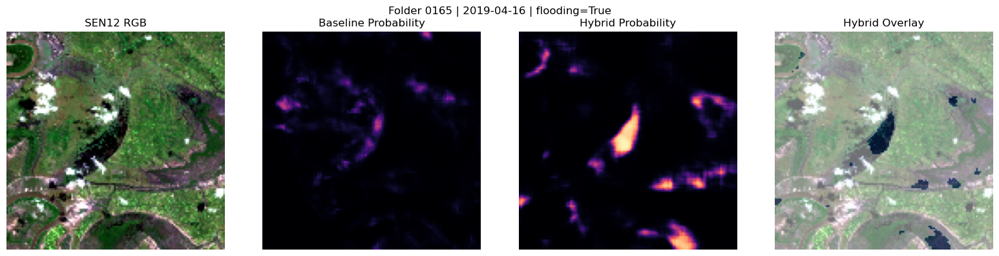

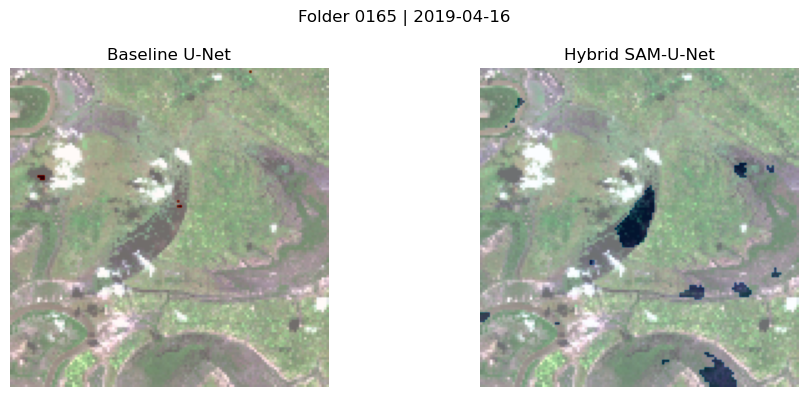

SEN12 inference:   8%|█████▌                                                            | 1/12 [00:03<00:40,  3.71s/it]

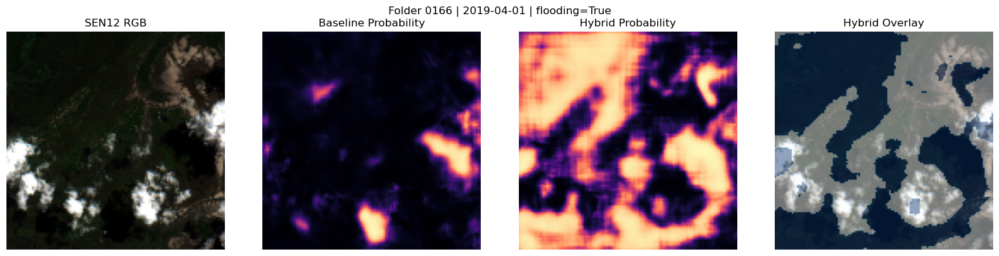

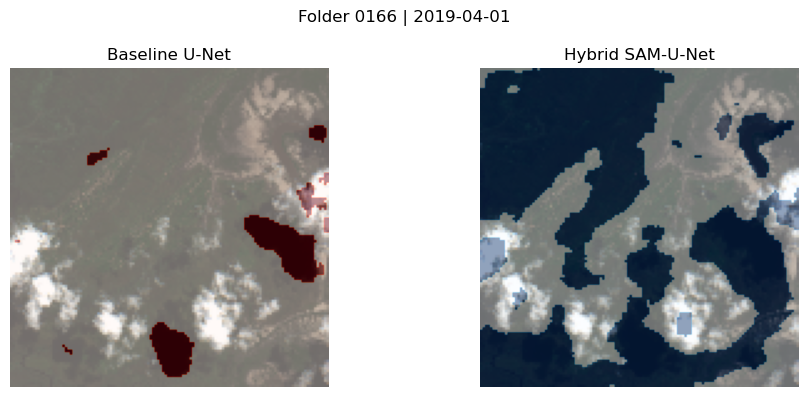

SEN12 inference:  17%|███████████                                                       | 2/12 [00:07<00:36,  3.66s/it]

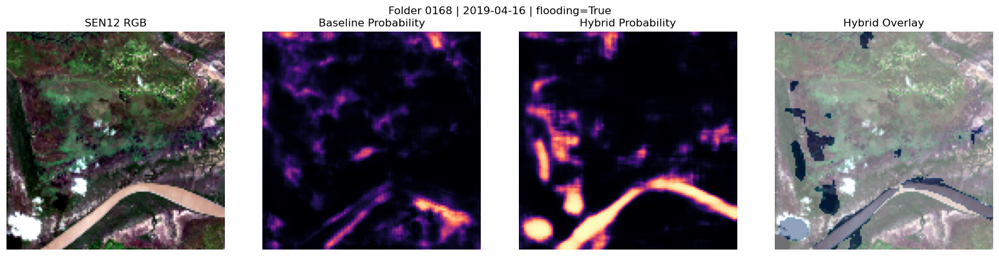

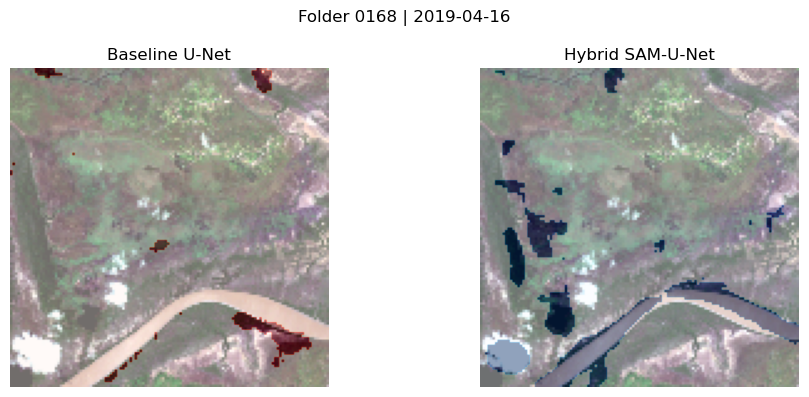

SEN12 inference:  25%|████████████████▌                                                 | 3/12 [00:10<00:32,  3.65s/it]

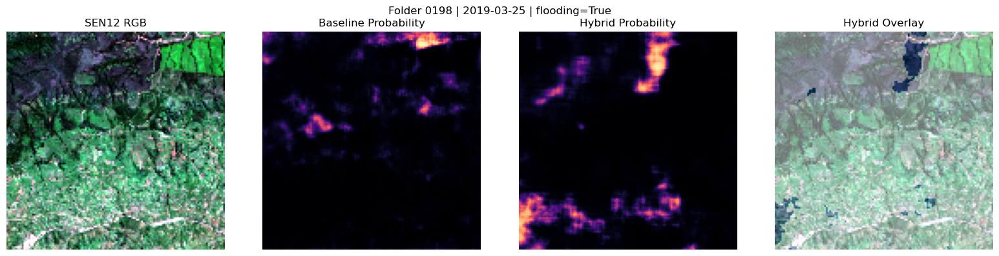

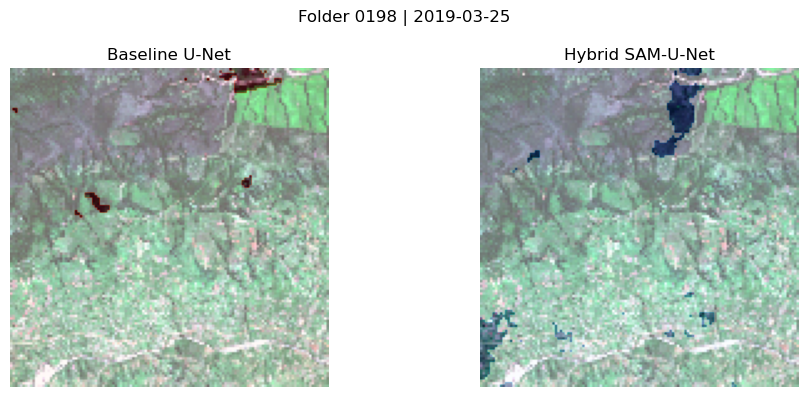

SEN12 inference:  33%|██████████████████████                                            | 4/12 [00:14<00:28,  3.60s/it]

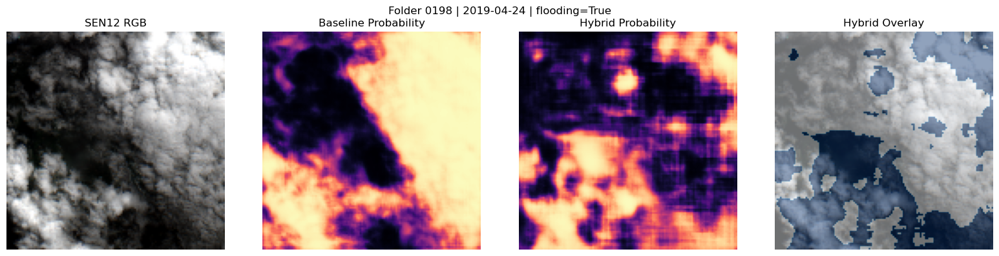

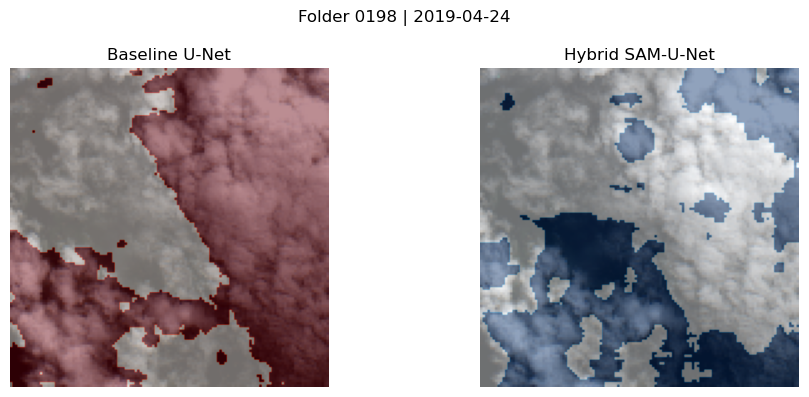

SEN12 inference:  42%|███████████████████████████▌                                      | 5/12 [00:18<00:25,  3.59s/it]

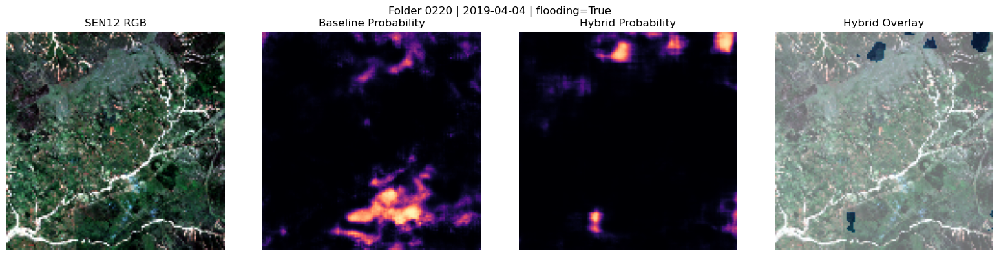

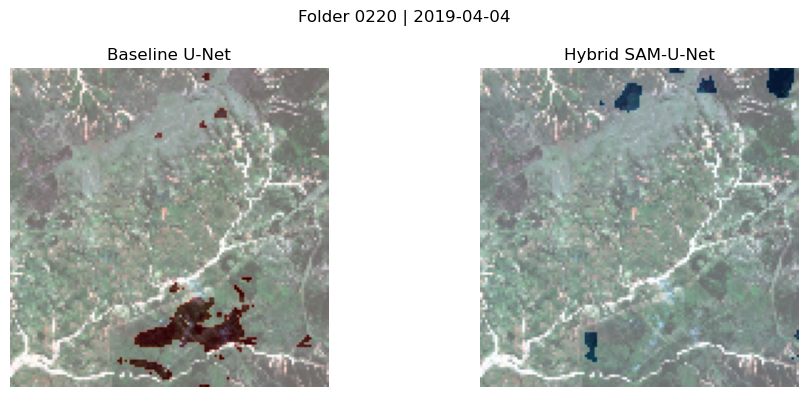

SEN12 inference:  50%|█████████████████████████████████                                 | 6/12 [00:21<00:21,  3.66s/it]

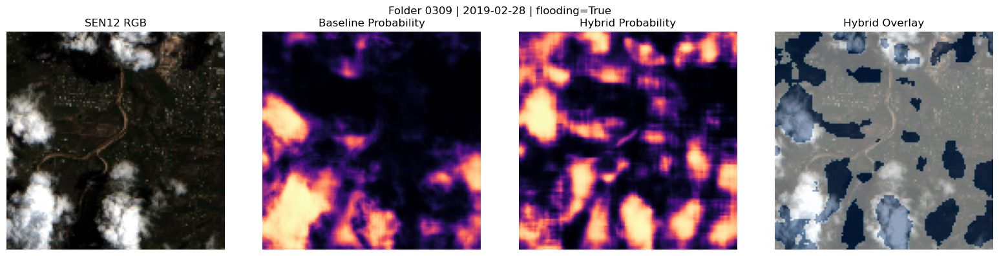

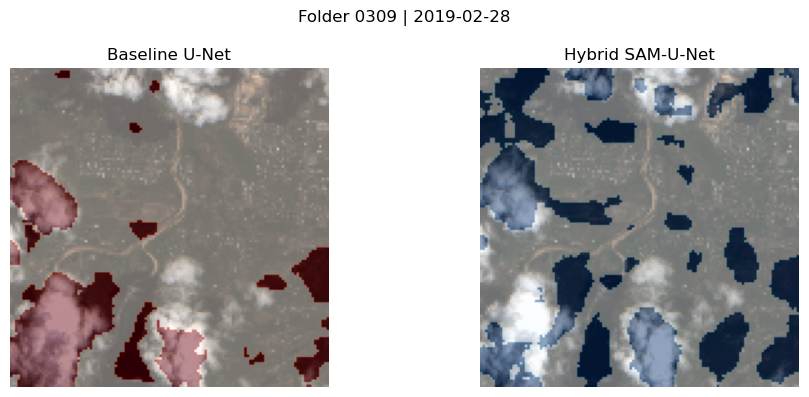

SEN12 inference:  58%|██████████████████████████████████████▌                           | 7/12 [00:25<00:18,  3.61s/it]

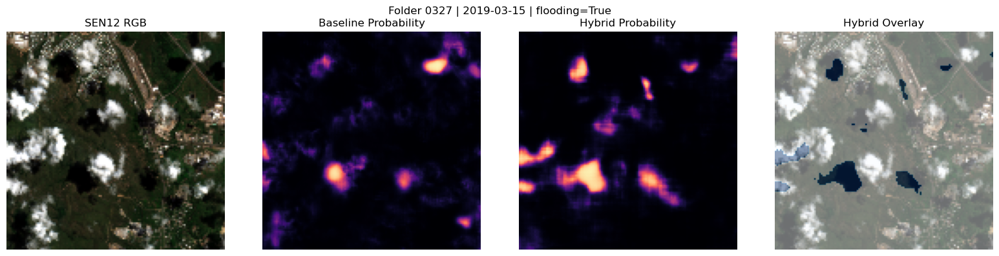

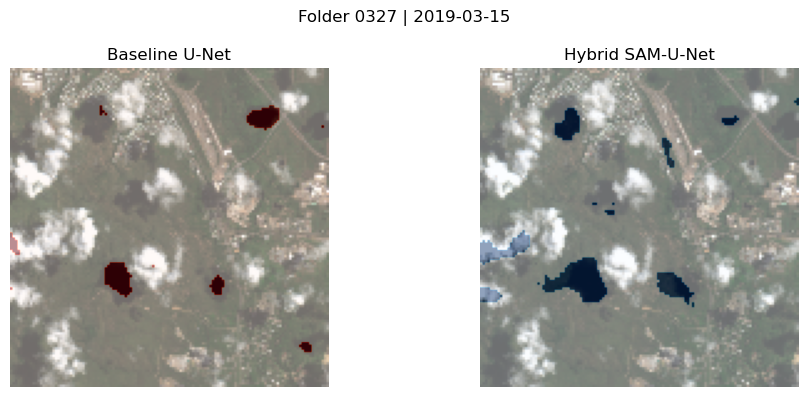

SEN12 inference:  67%|████████████████████████████████████████████                      | 8/12 [00:28<00:14,  3.57s/it]

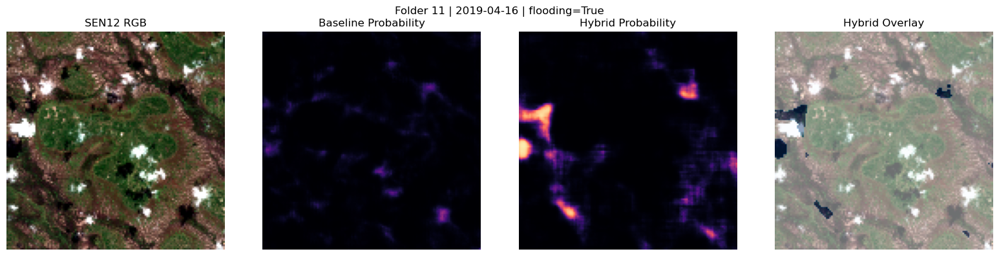

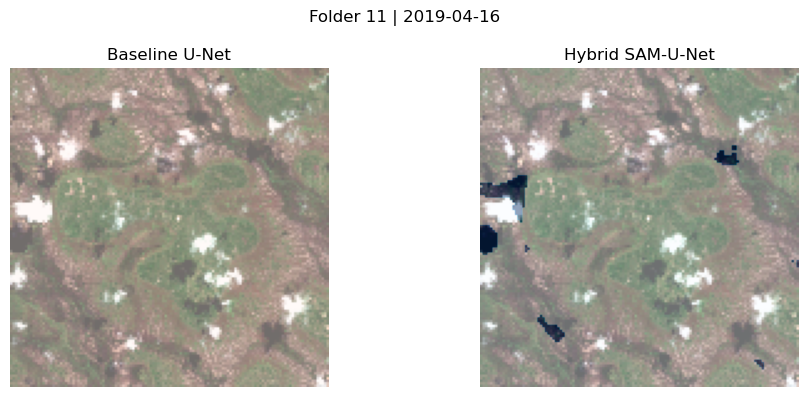

SEN12 inference:  75%|█████████████████████████████████████████████████▌                | 9/12 [00:32<00:10,  3.52s/it]

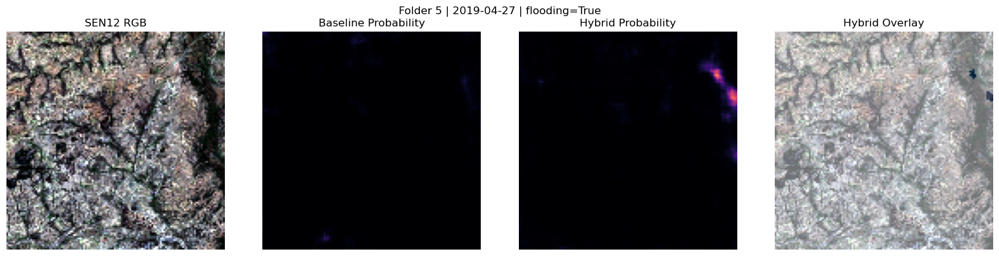

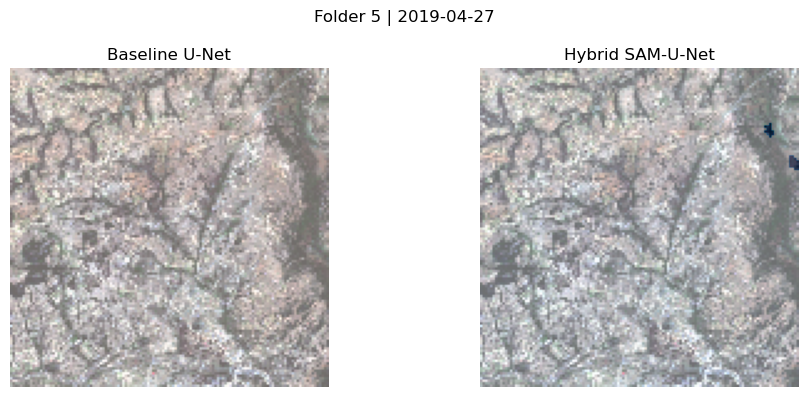

SEN12 inference:  83%|██████████████████████████████████████████████████████▏          | 10/12 [00:35<00:07,  3.52s/it]

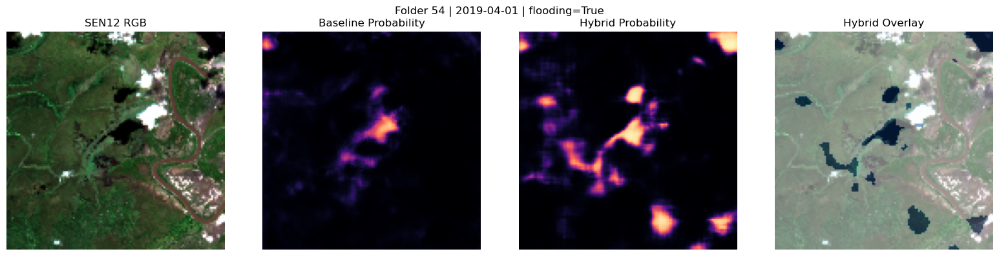

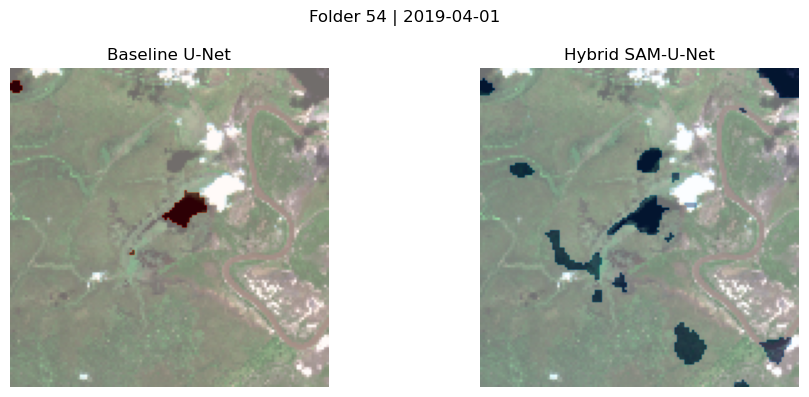

SEN12 inference:  92%|███████████████████████████████████████████████████████████▌     | 11/12 [00:39<00:03,  3.53s/it]

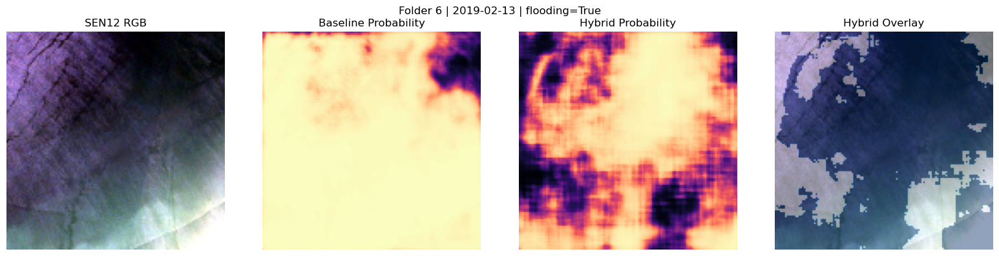

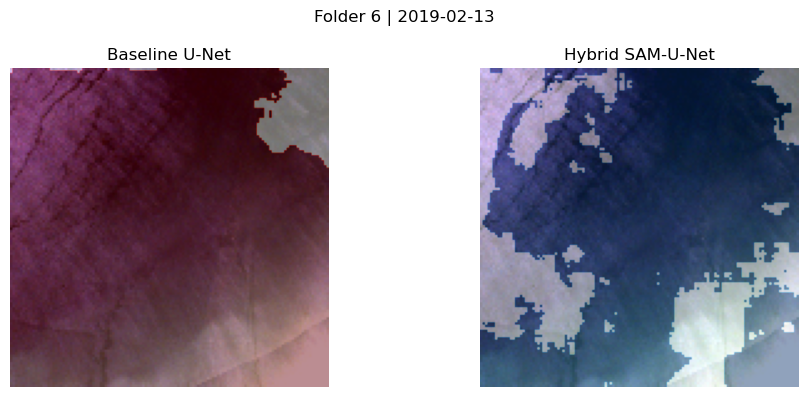

SEN12 inference: 100%|█████████████████████████████████████████████████████████████████| 12/12 [00:42<00:00,  3.58s/it]


,scene_id,folder,date,filename,flooding_metadata,full_data_coverage,baseline_predicted_fraction,hybrid_predicted_fraction,baseline_mean_probability,hybrid_mean_probability,seconds
0,0165_20190416,0165,2019-04-16,S2_2019-04-16,True,True,0.000549,0.028748,0.022924,0.050198,3.709612
1,0166_20190401,0166,2019-04-01,S2_2019-04-01,True,True,0.053162,0.509033,0.094433,0.495488,3.628102
2,0168_20190416,0168,2019-04-16,S2_2019-04-16,True,True,0.021423,0.106873,0.079409,0.137578,3.641444
3,0198_20190325,0198,2019-03-25,S2_2019-03-25,True,True,0.011536,0.033447,0.036315,0.060821,3.528214
4,0198_20190424,0198,2019-04-24,S2_2019-04-24,True,True,0.599976,0.385376,0.600733,0.405909,3.573057
5,0220_20190404,0220,2019-04-04,S2_2019-04-04,True,True,0.040771,0.018311,0.076118,0.036190,3.783634
6,0309_20190228,0309,2019-02-28,S2_2019-02-28,True,True,0.186768,0.300354,0.230292,0.339619,3.515213
7,0327_20190315,0327,2019-03-15,S2_2019-03-15,True,True,0.016663,0.042419,0.055120,0.068146,3.479756
8,11_20190416,11,2019-04-16,S2_2019-04-16,True,True,0.000000,0.020386,0.017964,0.047709,3.397248
9,5_20190427,5,2019-04-27,S2_2019-04-27,True,True,0.000000,0.002014,0.003490,0.009833,3.510638


Saved results to: D:\Research\hybrid_sam\FusionSAM-Flood-Mapping\results\notebook_06_sen12_inference


In [ ]:
summary_rows = []

for _, row in tqdm(selected_df.iterrows(), total=len(selected_df), desc="SEN12 inference"):
    start = time.time()
    outputs = predict_scene(row)
    save_prediction_arrays(row, outputs)
    plot_comparison(row, outputs)
    plot_overlay_pair(row, outputs)

    summary_rows.append({
        "scene_id": scene_id(row),
        "folder": row.folder,
        "date": row.date,
        "filename": row.filename,
        "flooding_metadata": bool(row.flooding),
        "full_data_coverage": bool(row.full_data_coverage),
        "baseline_predicted_fraction": float(outputs["baseline_pred"].mean()),
        "hybrid_predicted_fraction": float(outputs["hybrid_pred"].mean()),
        "baseline_mean_probability": float(outputs["baseline_prob"].mean()),
        "hybrid_mean_probability": float(outputs["hybrid_prob"].mean()),
        "seconds": time.time() - start,
    })

summary_df = pd.DataFrame(summary_rows)
summary_df.to_csv(RESULTS_DIR / "sen12_inference_summary.csv", index=False)
with open(RESULTS_DIR / "sen12_inference_summary.json", "w", encoding="utf-8") as f:
    json.dump(summary_rows, f, indent=2)

display(summary_df)
print("Saved results to:", RESULTS_DIR)

## Summary for Report

SEN12-FLOOD is used here for cross-dataset generalization analysis. Since pixel-level masks are unavailable, the results are qualitative. The saved outputs compare whether the Hybrid SAM-U-Net produces more spatially coherent flood/water predictions than the Baseline U-Net on unseen RGB Sentinel-2 imagery.

Important files:

- `results/notebook_06_sen12_inference/comparisons/`
- `results/notebook_06_sen12_inference/overlays/`
- `results/notebook_06_sen12_inference/prediction_arrays/`
- `results/notebook_06_sen12_inference/sen12_inference_summary.csv`
- `results/notebook_06_sen12_inference/sen12_fusion_shape_report.json`